# Implementing Neural network from scratch

In [1]:
#Importing necessary packages
from sklearn import preprocessing
import pandas as pd
import numpy as np

In [2]:
#Sigmoid Function
def sigmoid(z):
  return 1.0/(1 + np.exp(-z))
def sigmoid_derivative(z):
  return sigmoid(z) * (1.0 - sigmoid(z))

In [3]:
#function which takes train dataset variables, number of hidden layer, learning rate and number of iteration
def train(X, y, n_hidden, learning_rate, n_iter):
    m, n_input = X.shape
    W1 = np.random.randn(n_input, n_hidden)   #weights with random values
    b1 = np.zeros((1, n_hidden))              #bias as zero
    W2 = np.random.randn(n_hidden, 1)
    b2 = np.zeros((1, 1))

    #iteration to updating the new values of Weights & bias
    for i in range(1, n_iter+1):
        #calculate gradient with forward propagation
        Z2 = np.matmul(X, W1) + b1            #Weighted sum of X and W1 plus bias
        A2 = sigmoid(Z2)                      #calculating activation of hidden layer
        Z3 = np.matmul(A2, W2) + b2           #Weighted sum of hidden layer and W2 plus bias
        A3 = Z3                               #not having any activation output layer

        #Backward propagation calculate gradient
        dZ3 = A3 - y                          #Calculating derivative of cost function with respect to Z3
        dW2 = np.matmul(A2.T, dZ3)
        db2 = np.sum(dZ3, axis=0, keepdims = True)
        dZ2 = np.matmul(dZ3, W2.T) * sigmoid_derivative(Z2) #
        dW1 = np.matmul(X.T, dZ2)
        db1 = np.sum(dZ2, axis=0)

        #Updating the weights and bias with latest values
        W2 = W2 - learning_rate * dW2 / m
        b2 = b2 - learning_rate * db2 / m
        W1 = W1 - learning_rate * dW1 / m
        b1 = b1 - learning_rate * db1 / m

        #Print loss for every 100 iterations
        if i%100 == 0:
            cost = np.mean((y-A3)**2)
            print('Iteration %i, training loss: %f' %(i, cost))

    model = {'W1':W1 , 'b1':b1, 'W2':W2, 'b2':b2}
    return model

In [4]:
# Import Dataset followed by normalization

data_url = "http://lib.stat.cmu.edu/datasets/boston"
raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
target = raw_df.values[1::2, 2]
num_test = 10  # last 10 samples as testing set

scaler = preprocessing.StandardScaler() #(gradient normalize dataset)

X_train = data[:-num_test, :]
X_train = scaler.fit_transform(X_train)
y_train = target[:-num_test].reshape(-1, 1) #Column vector

X_test = data[-num_test:, :]
X_test = scaler.transform(X_test)
y_test = target[-num_test:]

In [5]:
# Training model with scaled data
n_hidden = 20
learning_rate = 0.1
n_iter = 2000
model = train(X_train, y_train, n_hidden, learning_rate, n_iter)

Iteration 100, training loss: 12.748752
Iteration 200, training loss: 9.077975
Iteration 300, training loss: 7.605435
Iteration 400, training loss: 6.749558
Iteration 500, training loss: 6.096959
Iteration 600, training loss: 5.621567
Iteration 700, training loss: 5.265138
Iteration 800, training loss: 4.987103
Iteration 900, training loss: 4.754135
Iteration 1000, training loss: 4.544304
Iteration 1100, training loss: 4.343728
Iteration 1200, training loss: 4.159546
Iteration 1300, training loss: 4.000287
Iteration 1400, training loss: 3.858815
Iteration 1500, training loss: 3.733402
Iteration 1600, training loss: 3.621438
Iteration 1700, training loss: 3.520272
Iteration 1800, training loss: 3.427706
Iteration 1900, training loss: 3.341883
Iteration 2000, training loss: 3.261476


In [6]:
# initilize predict function , takes in model and produce regression results
def predict(x, model):
    #Seperating model parameters
    W1 = model['W1']
    b1 = model['b1']
    W2 = model['W2']
    b2 = model['b2']

    # Performing forward propagation and computing the activation for hidden and output layer
    A2 = sigmoid(np.matmul(x, W1) + b1)
    A3 = np.matmul(A2, W2) + b2
    return A3

In [7]:
# Calculating predictions using the trained neural network model on the scaled test data
predictions = predict(X_test, model)

In [8]:
print(predictions)
print(y_test)

[[18.66701242]
 [18.35577427]
 [21.62805315]
 [17.56607702]
 [19.25052384]
 [26.12275264]
 [22.99253962]
 [30.24036132]
 [28.2102634 ]
 [22.34202257]]
[19.7 18.3 21.2 17.5 16.8 22.4 20.6 23.9 22.  11.9]


# Implementing neural networks with scikit-learn

In [9]:
#creating a model with 2 hidden layers using MLPRegressor
from sklearn.neural_network import MLPRegressor
nn_scikit = MLPRegressor(hidden_layer_sizes=(16,8), activation='relu', solver='adam', learning_rate_init=0.001,
                         random_state=42, max_iter=2000)

In [10]:
nn_scikit.fit(X_train, y_train)
predictions = nn_scikit.predict(X_test)
print(predictions)

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1623: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[16.79582331 18.55538023 21.07961496 19.21362606 18.50955771 23.5608387
 22.27916529 27.11909153 24.70251262 22.05522035]


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(


In [11]:
# Calculating Mean Squared Error between predicted and test values
print(np.mean((y_test - predictions) ** 2))

13.933482332708795


# Implementing neural network using TensorFlow

In [12]:
# Importing necessary packages and setting a random seed which is recommended for reproducible modeling
import tensorflow as tf
from tensorflow import keras
# Setting a random seed to ensure reproducibility
tf.random.set_seed(42)

In [13]:
# Creating a sequential model using keras with 2 hidden and 1 output layer
model = keras.Sequential([keras.layers.Dense(units=20, activation='relu'),
                         keras.layers.Dense(units=8, activation='relu'),
                         keras.layers.Dense(units=1)])

In [14]:
# Compiling model with Adam as optimizer and MSE as learning goal
model.compile(loss='mean_squared_error', optimizer= tf.keras.optimizers.Adam(0.02))

In [15]:
# Fitting and training the model with training dataset
model.fit(X_train, y_train, epochs=300)

Epoch 1/300
16/16 [==============================] - 2s 4ms/step - loss: 345.1819
Epoch 2/300
16/16 [==============================] - 0s 3ms/step - loss: 93.0154
Epoch 3/300
16/16 [==============================] - 0s 4ms/step - loss: 37.1187
Epoch 4/300
16/16 [==============================] - 0s 4ms/step - loss: 25.3711
Epoch 5/300
16/16 [==============================] - 0s 4ms/step - loss: 21.0214
Epoch 6/300
16/16 [==============================] - 0s 6ms/step - loss: 18.5290
Epoch 7/300
16/16 [==============================] - 0s 5ms/step - loss: 15.6737
Epoch 8/300
16/16 [==============================] - 0s 5ms/step - loss: 15.3495
Epoch 9/300
16/16 [==============================] - 0s 4ms/step - loss: 13.3523
Epoch 10/300
16/16 [==============================] - 0s 3ms/step - loss: 12.4635
Epoch 11/300
16/16 [==============================] - 0s 3ms/step - loss: 12.4272
Epoch 12/300
16/16 [==============================] - 0s 4ms/step - loss: 11.8753
Epoch 13/300
16/16 [====

In [16]:
# Predictions
predictions = model.predict(X_test)[:, 0]
print(predictions)

1/1 [==============================] - 0s 93ms/step
[13.993995 18.86872  20.381937 18.272715 19.338467 25.27299  22.62984
 26.988424 25.563023 22.573288]


In [17]:
# MSE Value
print(np.mean((y_test - predictions)**2))

18.91189575719489


# Predicting Stock prices using neural network

In [18]:
# Importing Dataset
myData = pd.read_csv('20051201_20051210.csv', index_col='Date')
myData

,Open,High,Low,Close,Volume
Date,,,,,
1896-05-27,29.39,29.39,29.39,29.39,NaN
1896-05-28,29.11,29.11,29.11,29.11,NaN
1896-05-29,29.43,29.43,29.43,29.43,NaN
1896-06-01,29.40,29.40,29.40,29.40,NaN
1896-06-02,29.00,29.00,29.00,29.00,NaN
...,...,...,...,...,...
2023-09-22,34077.08,34156.15,33947.24,33963.84,271637529.0
2023-09-25,33907.59,34017.53,33780.67,34006.88,231585605.0
2023-09-26,33862.68,33879.93,33569.60,33618.88,282543663.0


In [19]:
# Creating features from original dataframe
def add_original_feature(df, df_new):
    df_new['open'] = df['Open']
    df_new['open_1'] = df['Open'].shift(1)
    df_new['close_1'] = df['Close'].shift(1)
    df_new['high_1'] = df['High'].shift(1)
    df_new['low_1'] = df['Low'].shift(1)
    df_new['volume_1'] = df['Volume'].shift(1)

In [20]:
# features related to average close prices
def add_avg_price(df, df_new):
    df_new['avg_price_5'] = df['Close'].rolling(5).mean().shift(1)
    df_new['avg_price_30'] = df['Close'].rolling(21).mean().shift(1)
    df_new['avg_price_365'] = df['Close'].rolling(252).mean().shift(1)
    df_new['ratio_avg_price_5_30'] = df_new['avg_price_5'] / df_new['avg_price_30']
    df_new['ratio_avg_price_5_365'] = df_new['avg_price_5'] / df_new['avg_price_365']
    df_new['ratio_avg_price_30_365'] = df_new['avg_price_30'] / df_new['avg_price_365']

In [21]:
#  Creating features related to average volumes
def add_avg_volume(df, df_new):
    df_new['avg_volume_5'] = df['Volume'].rolling(5).mean().shift(1)
    df_new['avg_volume_30'] = df['Volume'].rolling(21).mean().shift(1)
    df_new['avg_volume_365'] = df['Volume'].rolling(252).mean().shift(1)
    df_new['ratio_avg_volume_5_30'] = df_new['avg_volume_5'] / df_new['avg_volume_30']
    df_new['ratio_avg_volume_5_365'] = df_new['avg_volume_5'] / df_new['avg_volume_365']
    df_new['ratio_avg_volume_30_365'] = df_new['avg_volume_30'] / df_new['avg_volume_365']

In [22]:
# Creating a function for the price related features
def add_std_price(df, df_new):
    df_new['std_price_5'] = df['Close'].rolling(5).std().shift(1)
    df_new['std_price_30'] = df['Close'].rolling(21).std().shift(1)
    df_new['std_price_365'] = df['Close'].rolling(252).std().shift(1)
    df_new['ratio_std_price_5_30'] = df_new['std_price_5'] / df_new['std_price_30']
    df_new['ratio_std_price_5_365'] = df_new['std_price_5'] / df_new['std_price_365']
    df_new['ratio_std_price_30_365'] = df_new['std_price_30'] / df_new['std_price_365']

In [23]:
# Creating a function that generates 6 volume-based standard deviation features
def add_std_volume(df, df_new):
    df_new['std_volume_5'] = df['Volume'].rolling(5).std().shift(1)
    df_new['std_volume_30'] = df['Volume'].rolling(21).std().shift(1)
    df_new['std_volume_365'] = df['Volume'].rolling(252).std().shift(1)
    df_new['ratio_std_volume_5_30'] = df_new['std_volume_5'] / df_new['std_volume_30']
    df_new['ratio_std_volume_5_365'] = df_new['std_volume_5'] / df_new['std_volume_365']
    df_new['ratio_std_volume_30_365'] = df_new['std_volume_30'] / df_new['std_volume_365']

In [24]:
# Creating return-based function
def add_return_feature(df, df_new):
    df_new['return_1'] = ((df['Close'] - df['Close'].shift(1))
                         /df['Close'].shift(1).shift(1))
    df_new['return_5'] = ((df['Close'] - df['Close'].shift(5))
                         /df['Close'].shift(5).shift(1))
    df_new['return_30'] = ((df['Close'] - df['Close'].shift(21))
                         /df['Close'].shift(21).shift(1))
    df_new['return_365'] = ((df['Close'] - df['Close'].shift(252))
                         /df['Close'].shift(252).shift(1))
    df_new['moving_avg_5'] = df_new['return_1'].rolling(5).mean().shift(1)
    df_new['moving_avg_30'] = df_new['return_1'].rolling(21).mean().shift(1)
    df_new['moving_avg_365'] = df_new['return_1'].rolling(252).mean().shift(1)

In [25]:
#main feature generation function that calls all the before created sub-functions
def generate_features(df):
    """Generate features for a stock/index based on historical price and performance
    @param df: dataframe with columns 'Open', 'Close','High', 'Low', 'Volume', 'Adjusted Close'
    @return: dataframe, data set with new features
    """

    df_new = pd.DataFrame()
    #6 original features
    add_original_feature(df, df_new)

    #31 generated features
    add_avg_price(df, df_new)
    add_avg_volume(df, df_new)
    add_std_price(df, df_new)
    add_std_volume(df, df_new)
    add_return_feature(df, df_new)

    # the target
    df_new['close'] = df['Close']
    df_new = df_new.dropna(axis=0)
    return df_new

In [26]:
# Importing data
data_raw = pd.read_csv('19880101_20191231.csv')
data = generate_features(data_raw)

In [27]:
print(data.round(decimals=3).head(5))

       open  open_1  close_1  high_1   low_1    volume_1  avg_price_5  \
254  2146.6  2168.4   2144.6  2168.4  2127.1  17302883.0      2165.00   
255  2177.7  2146.6   2177.7  2183.4  2146.6  15714720.0      2168.00   
256  2190.5  2177.7   2190.5  2205.2  2173.0  20303094.0      2172.82   
257  2194.3  2190.5   2194.3  2213.8  2182.3  16494441.0      2175.14   
258  2199.5  2194.3   2199.5  2209.1  2185.0  18410324.0      2181.32   

     avg_price_30  avg_price_365  ratio_avg_price_5_30  ...  \
254      2150.624       2062.113                 1.007  ...   
255      2154.690       2062.668                 1.006  ...   
256      2157.867       2063.218                 1.007  ...   
257      2160.005       2064.341                 1.007  ...   
258      2162.190       2065.351                 1.009  ...   

     ratio_std_volume_5_365  ratio_std_volume_30_365  return_1  return_5  \
254                   0.563                    0.723     0.015     0.007   
255                   0.474   

# Training a simple neural network

In [28]:
data_raw = pd.read_csv('19880101_20191231.csv', index_col='Date')
data = generate_features(data_raw)

In [29]:
start_train = '1988-01-01'
end_train = '2018-12-31'
start_test = '2019-01-01'
end_test = '2019-12-31'

data_train = data.loc[start_train:end_train]
X_train = data_train.drop('close', axis=1).values
y_train = data_train['close'].values

data_test = data.loc[start_test:end_test]
X_test = data_test.drop('close', axis=1).values
y_test = data_test['close'].values

In [30]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X_scaled_train = scaler.fit_transform(X_train)
X_scaled_test = scaler.transform(X_test)

In [31]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
model = Sequential([
    Dense (units=32, activation='relu'),#The first layer has 32 units and uses the ReLU activation function
    Dense (units=1)#The second layer has 1 unit with activation function
])

In [32]:
model.compile(loss='mean_squared_error', optimizer=tf.keras.optimizers.Adam(0.1))

In [33]:
# Training the model on the training data for 100 epochs
model.fit(X_scaled_train, y_train, epochs=100, verbose=True)

Epoch 1/100
237/237 [==============================] - 1s 2ms/step - loss: 32638580.0000
Epoch 2/100
237/237 [==============================] - 0s 2ms/step - loss: 2044787.6250
Epoch 3/100
237/237 [==============================] - 0s 2ms/step - loss: 548609.0625
Epoch 4/100
237/237 [==============================] - 0s 2ms/step - loss: 178769.9219
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 72982.3125
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 36654.8594
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 21487.6250
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 14776.7822
Epoch 9/100
237/237 [==============================] - 0s 2ms/step - loss: 11234.0303
Epoch 10/100
237/237 [==============================] - 0s 2ms/step - loss: 10476.2949
Epoch 11/100
237/237 [==============================] - 0s 2ms/step - loss: 8786.5723
Epoch 12/100
237/237 [========================

In [34]:
# Predictions
predictions= model.predict(X_scaled_test)[:,0]

8/8 [==============================] - 0s 2ms/step


In [35]:
# Calculating the MSE,MAE,R^2
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
print(f'MSE: {mean_squared_error(y_test,predictions):.3f}')
print(f'MAE: {mean_absolute_error(y_test,predictions):.3f}')
print(f'R^2: {r2_score(y_test,predictions):.3f}')

MSE: 12615.231
MAE: 85.044
R^2: 0.989


# Fine tuning the neural network

In [36]:
from tensorboard.plugins.hparams import api as hp

In [37]:
HP_HIDDEN = hp.HParam('hidden_size', hp.Discrete([64, 32, 16]))         #number of neurons in the hidden layer of a neural network
HP_EPOCHS = hp.HParam('epochs', hp.Discrete([300, 1000]))               #number of epochs used to train a neural network
HP_LEARNING_RATE = hp.HParam('learning_rate', hp.RealInterval(0.01,0.4))#learning rate used to train a neural network

In [38]:
def train_test_model(hparams, logdir):
    model = Sequential([
        Dense(units = hparams[HP_HIDDEN], activation='relu'),
        Dense(units=1)
        ])
    # Compilation
    model.compile(loss = 'mean_squared_error',
                  optimizer = tf.keras.optimizers.Adam(hparams[HP_LEARNING_RATE]),
                                                       metrics=['mean_squared_error'])
    # Model-Fitting
    # Logging the training process using TensorBoard, logging the hyperparameters using KerasCallback,
    # EarlyStopping to prevent overfitting
    model.fit(X_scaled_train, y_train,
             validation_data=(X_scaled_test, y_test),
             epochs = hparams[HP_EPOCHS], verbose=False,
             callbacks=[
                 tf.keras.callbacks.TensorBoard(logdir),
                 hp.KerasCallback(logdir, hparams),
                 tf.keras.callbacks.EarlyStopping(
                 monitor='val_loss', min_delta=0,
                 patience=200, verbose=0,
                 mode='auto',
                 )
             ],
             )

    # Evaluation of model
    _, mse = model.evaluate(X_scaled_test, y_test)
    pred = model.predict(X_scaled_test)
    r2 = r2_score(y_test, pred)
    return mse, r2

In [39]:
def run(hparams, logdir):
    # Creation of summary file writer for TensorBoard logging
    with tf.summary.create_file_writer(logdir).as_default():
        # Configuration of hyperparameters and metrics for logging
        hp.hparams_config(
            hparams=[HP_HIDDEN, HP_EPOCHS, HP_LEARNING_RATE],
            metrics=[hp.Metric('mean_squared_error', display_name='mse'),
                     hp.Metric('r2', display_name='r2')]
        )
        mse, r2 = train_test_model(hparams, logdir)
        tf.summary.scalar('mean_squared_error', mse, step=1)
        tf.summary.scalar('r2', r2, step=1)


In [40]:
session_num = 0  # Initialize session_num

for hidden in HP_HIDDEN.domain.values:
    for epochs in HP_EPOCHS.domain.values:
        for learning_rate in tf.linspace(HP_LEARNING_RATE.domain.min_value, HP_LEARNING_RATE.domain.max_value, 5):
            hparams = {
                HP_HIDDEN: hidden,
                HP_EPOCHS: epochs,
                HP_LEARNING_RATE: float("%.2f" % float(learning_rate))
            }
            # Generating a unique name for the current trial based on the session number
            run_name = "run-%d" % session_num
            print('--- Starting trial: %s' % run_name)
            print({h.name: hparams[h] for h in hparams})
            # Running the training process for the current trial using the run function
            run(hparams, 'logs/hparam_tuning/' + run_name)
            session_num += 1

--- Starting trial: run-0
{'hidden_size': 16, 'epochs': 300, 'learning_rate': 0.01}
8/8 [==============================] - 0s 2ms/step
--- Starting trial: run-1
{'hidden_size': 16, 'epochs': 300, 'learning_rate': 0.11}
8/8 [==============================] - 0s 2ms/step
--- Starting trial: run-2
{'hidden_size': 16, 'epochs': 300, 'learning_rate': 0.21}
8/8 [==============================] - 0s 2ms/step
--- Starting trial: run-3
{'hidden_size': 16, 'epochs': 300, 'learning_rate': 0.3}
8/8 [==============================] - 0s 3ms/step
--- Starting trial: run-4
{'hidden_size': 16, 'epochs': 300, 'learning_rate': 0.4}
8/8 [==============================] - 0s 2ms/step
--- Starting trial: run-5
{'hidden_size': 16, 'epochs': 1000, 'learning_rate': 0.01}
8/8 [==============================] - 0s 3ms/step
--- Starting trial: run-6
{'hidden_size': 16, 'epochs': 1000, 'learning_rate': 0.11}
8/8 [==============================] - 0s 2ms/step
--- Starting trial: run-7
{'hidden_size': 16, 'epochs':

In [41]:
# Launching external tensorboard
%load_ext tensorboard
%tensorboard --logdir='./logs/hparam_tuning'

<IPython.core.display.Javascript object>

In [42]:
# Defining an optimal model to make predictions
model = Sequential([Dense(units=16, activation='relu'),
                   Dense(units=1)
                   ])
model.compile(loss='mean_squared_error',
             optimizer = tf.keras.optimizers.Adam(0.21))
model.fit(X_scaled_train, y_train, epochs=1000, verbose=False)
predictions = model.predict(X_scaled_test)[:,0]

8/8 [==============================] - 0s 2ms/step


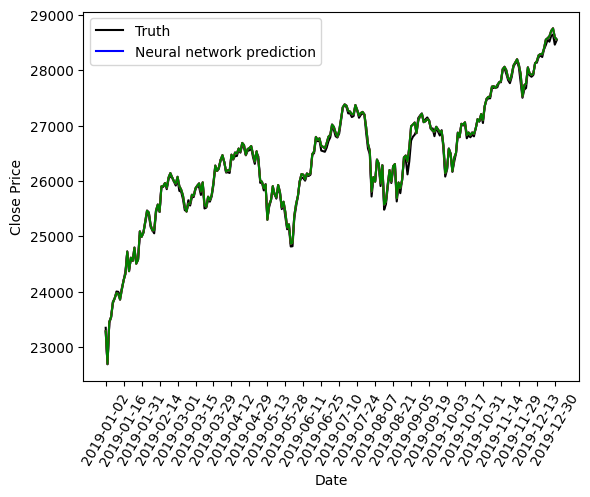

In [43]:
# Plotting a curve
import matplotlib.pyplot as plt
plt.plot(data_test.index, y_test, c='k')
plt.plot(data_test.index, predictions, c='b')
plt.plot(data_test.index, predictions, c='r')
plt.plot(data_test.index, predictions, c='g')
plt.xticks(range(0, 252, 10), rotation=60)
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend(['Truth', 'Neural network prediction'])
plt.show()